In [2]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

In [3]:



class GeneExpression:
    def __init__(self, base_str : str) -> None:
        self.base_str = base_str
        self.setup()
        self.properties = np.zeros(self.base.shape[0])

    def reset(self):
        self.properties = np.zeros(self.base.shape[0])
        

    def setup(self):
        gene_positions_dict = {}

        gene_positions = np.genfromtxt('bdtnp.txt', skip_header=0, dtype=str).T


        for i in range(len(gene_positions)):
            gene_positions_dict[gene_positions[i][0]] = gene_positions[i][1:].astype(float)


        self.gene_positions_dict = gene_positions_dict

        geometry = np.genfromtxt('geometry.txt', skip_header=1)

        self.geometry = geometry


        self.base = self.get_base(self.base_str)


    def get_map(self, gene : str, plot = True):
        assert gene in self.gene_positions_dict, "Gene not found in gene_positions :("

        # gene_expression = expressions_dict[gene]
        gene_position = self.gene_positions_dict[gene]

        twice = np.hstack((gene_position, gene_position))

        geometry = self.geometry
        
        if plot:
            plt.scatter(geometry[:,0][geometry[:, 2] < 0], geometry[:,1][geometry[:, 2] < 0], c=twice[geometry[:, 2] < 0], cmap='viridis')
            plt.scatter(geometry[:,0][geometry[:,1] > 0], geometry[:,2][geometry[:,1] > 0]-150, c=twice[geometry[:,1] > 0], cmap='viridis')
            plt.title(gene)
            plt.colorbar()
            plt.show()

        return twice



    def get_base(self, base_str):
        with h5py.File(base_str, 'r') as f:
            poss = f['x'][-1]


        # rotate 10 degrees along y axis
        theta = -3
        theta = np.radians(theta)
        c, s = np.cos(theta), np.sin(theta)
        R = np.array(((c, 0, s), (0, 1, 0), (-s, 0, c)))

        poss = np.dot(poss, R.T)
        # poss[:,0] = poss[:,0]*2.95 + 10
        # poss[:,1] = poss[:,1]*2.8
        # poss[:,2] = poss[:,2]*2.8-5

        poss[:,0] = poss[:,0]*3.25 + 20
        poss[:,1] = poss[:,1]*3.15
        poss[:,2] = poss[:,2]*3.15 -5

        return poss


        

    def at_gene(self, gene, plot = False):

        map = self.get_map(gene, plot)

        colors = []
        for pos in self.base:
            # find average hkb expression in the vicinity
            dists = np.linalg.norm(self.geometry - pos, axis=1)
            close = dists < 10
            if np.sum(close) == 0:
                close = dists < 50
            colors.append(np.mean(map[close]))

        colors = np.array(colors)

        return colors
    
    def get_gradients_of_gene(self, gene : str, plot = False):
        map = self.get_map(gene, False)

        gradients = []
        for pos in self.base:
            # find average hkb expression in the vicinity
            dists = np.linalg.norm(self.geometry - pos, axis=1)
            close = dists < 12

            # remove the point itself
            close = np.logical_and(close, dists > 0.1)

            # find the gradient
            gradient = np.zeros(3)

            for i in range(3):
                gradient[i] = np.mean(map[close] * (self.geometry[close,i] - pos[i]))

            if gradient[0] < 0:
                gradient = -gradient
                
            gradients.append(gradient)

        if plot:
            plt.quiver(self.base[:,0], self.base[:,1], np.array(gradients)[:,0], np.array(gradients)[:,1])
            plt.quiver(self.base[:,0], self.base[:,2]-150, np.array(gradients)[:,0], np.array(gradients)[:,2])
        
        return np.array(gradients)
            
    def prettyplot(self, gene_name, ax):
        colors = self.at_gene(gene_name, False)

        closez = self.base[:,2] < 0
        ax.scatter(self.base[:,0][closez], self.base[:,1][closez], c=colors[closez], alpha=1, cmap = "jet")

        closey = self.base[:,1] > 0
        ax.scatter(self.base[:,0][closey], self.base[:,2][closey]-150, c=colors[closey], alpha=1, cmap = "jet")

    def gene(self, gene_name : str, plot = False):
        colors = self.at_gene(gene_name, plot)
    

        if plot:
            closez = self.base[:,2] < 0
            plt.scatter(self.base[:,0][closez], self.base[:,1][closez], c=colors[closez], alpha=1)

            closey = self.base[:,1] > 0
            plt.scatter(self.base[:,0][closey], self.base[:,2][closey]-150, c=colors[closey], alpha=1)
            plt.show()

        return colors
    
    def and_gene(self, gene1 : np.array, gene2 : np.array):
        colors = np.minimum(gene1, gene2)
        return colors
    
    def or_gene(self, gene1 : np.array, gene2 : np.array):
        colors = np.maximum(gene1, gene2)
        return colors
    
    def not_gene(self, gene1 : np.array, gene2 : np.array):
        colors = np.maximum(gene1 - gene2, 0.)
        return colors
    

    def add_expression(self, expression : np.array, threshold = 0.5, plot = False, num = 0):
        
        colors = expression > threshold
    
        if plot:
            closez = self.base[:,2] < 0
            plt.scatter(self.base[:,0][closez], self.base[:,1][closez], c=expression[closez], alpha=1)

            closey = self.base[:,1] > 0
            plt.scatter(self.base[:,0][closey], self.base[:,2][closey]-150, c=expression[closey], alpha=1)
            plt.show()

            closez = self.base[:,2] < 0
            plt.scatter(self.base[:,0][closez], self.base[:,1][closez], c=colors[closez], alpha=1)

            closey = self.base[:,1] > 0
            plt.scatter(self.base[:,0][closey], self.base[:,2][closey]-150, c=colors[closey], alpha=1)
            plt.show()

        self.properties[colors] = num

    def get_fifth_run_stripe(self, plot : bool = False):
        positions = self.base

        x, y, z = positions[:,0], positions[:,1], positions[:,2]

        gene_expression = np.zeros(self.base.shape[0])
        gene_expression[(x+(z-50)/10. > 45)*(x+(z-50)/10.<75)] = 1
        
        if plot:
            closez = z < 0
            plt.scatter(x[closez], y[closez], c=gene_expression[closez], alpha=1)

            closey = y > 0
            plt.scatter(x[closey], z[closey]-150, c=gene_expression[closey], alpha=1)
            plt.show()
        
        return gene_expression

    def get_second_run_stripe(self, plot : bool = False):
        positions = self.base

        x, y, z = positions[:,0], positions[:,1], positions[:,2]

        gene_expression = np.zeros(self.base.shape[0])
        gene_expression[(x-(z-50)/10. > -50)*(x-(z-50)/10.<-50+30)] = 1
        
        if plot:
            closez = z < 0
            plt.scatter(x[closez], y[closez], c=gene_expression[closez], alpha=1)

            closey = y > 0
            plt.scatter(x[closey], z[closey]-150, c=gene_expression[closey], alpha=1)
            plt.show()
        
        return gene_expression
       

    def save(self, filename, q_from_runt = False):
        with h5py.File(self.base_str, 'r') as f:
            x = f['x'][:]
            p = f['p'][:]
            q = f['q'][:]

        if q_from_runt:
            runt_grad = self.get_gradients_of_gene("run")
            eve_grad = self.get_gradients_of_gene("eve")

            runt_grad_norm = np.linalg.norm(runt_grad, axis=1)
            eve_grad_norm = np.linalg.norm(eve_grad, axis=1)

            # make a new array with the longest gradient at each point
            longest_grad = np.argmax(np.array([runt_grad_norm, eve_grad_norm]), axis=0)

            max_grad = np.where(longest_grad[:,None] == 0, runt_grad, eve_grad)

            # normalize the gradient
            norm_grad = np.linalg.norm(max_grad, axis=1)

            max_grad = max_grad / norm_grad[:,None]

            q = [np.cross(pp,max_grad) for pp in p]

            

        with h5py.File(filename + ".hdf5", "w") as f:
            create = lambda name, data: f.create_dataset(name, data=data)

            create("x", x)

            create("p", p)

            create("q", q)
            
            create("properties", [self.properties])

            # f.attrs.update(attrs)


# and snail and twist
GE = GeneExpression("11th_egg.hdf5")


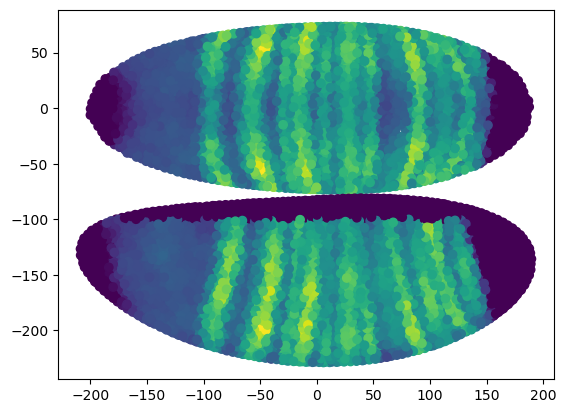

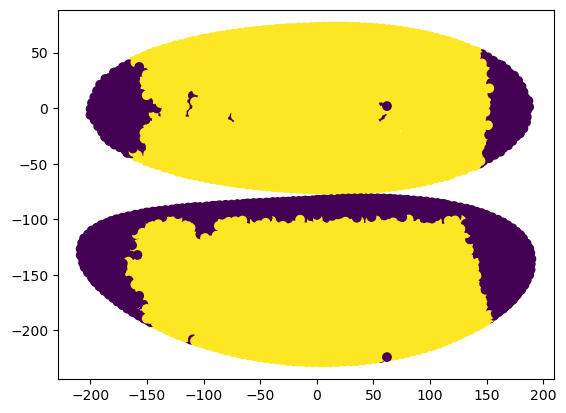

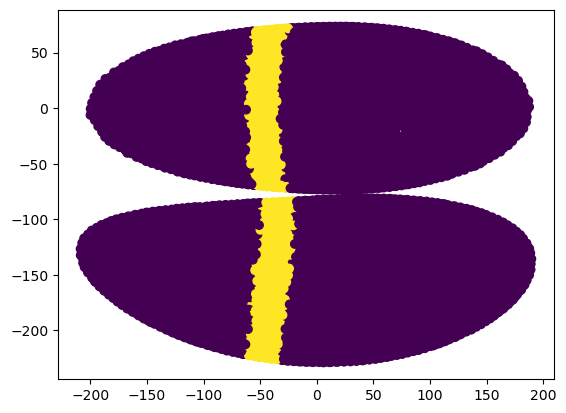

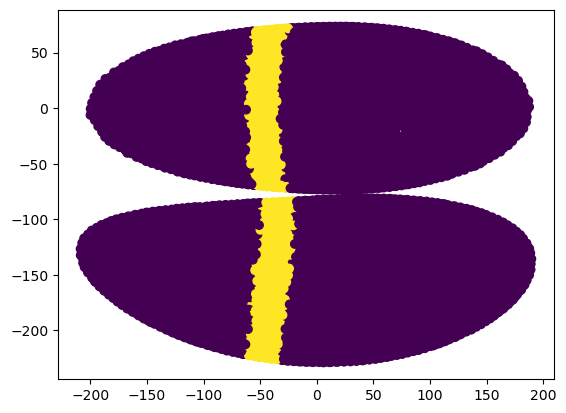

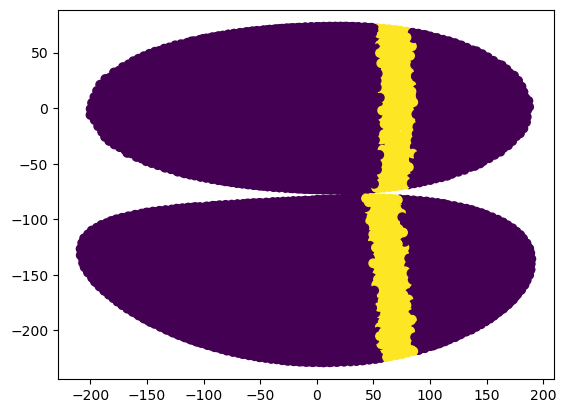

...

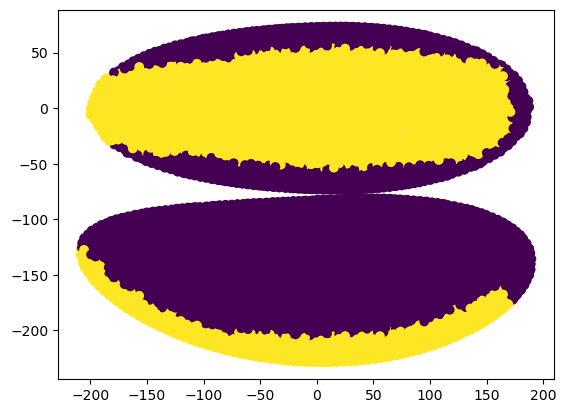

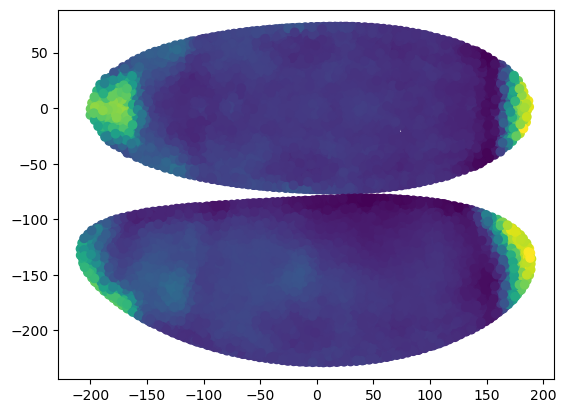

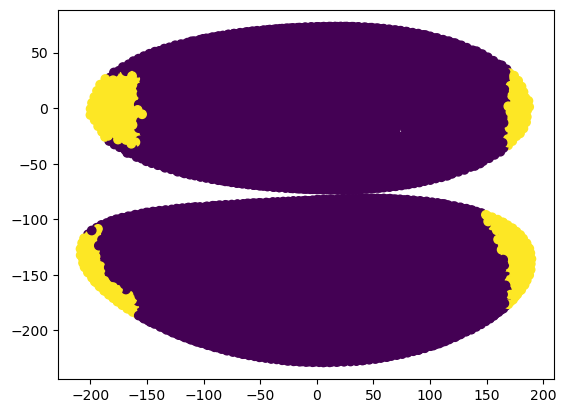

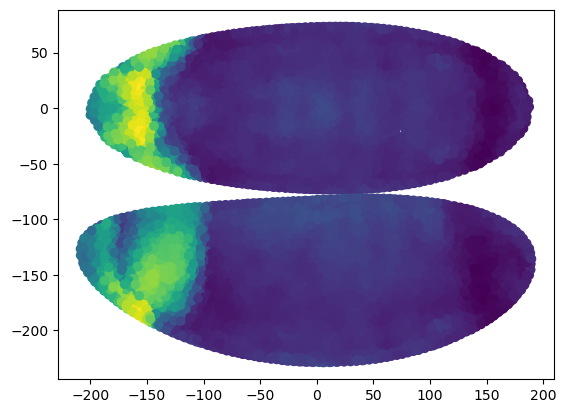

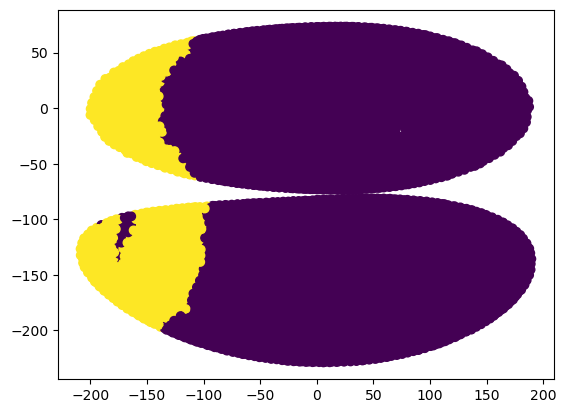

In [4]:
GE.reset()

GB = GE.or_gene(GE.gene("eve"), GE.gene("run"))



GB[GE.base[:,2] > 50] = 0

GB = GE.not_gene(GB, GE.gene("fkh"))


GE.add_expression(GB, 0.2, True, 1)  # Germ Band

GE.add_expression(GE.get_second_run_stripe(), 0.4, True, 5)  # Second Run Stripe

GE.add_expression(GE.get_fifth_run_stripe(), 0.4, True, 5)  # fifth Run Stripe


Amnio = GE.and_gene(GE.gene("sna"), GE.gene("twi"))
GB[GE.base[:,2] < 50] = 0

GE.add_expression(Amnio, 0.1, True, 3)  # Amnioserosa


# GE.add_expression(GE.not_gene(GE.or_gene(GE.gene("eve"), GE.gene("run")), GE.gene("Doc2")), 0.2, True, 1)  # Germ Band

GE.add_expression(GE.gene("Dfd"), 0.6, True, 5)  # Cephalic Furrow


# GE.add_expression(GE.not_gene(GE.and_gene(GE.gene("Kr"),GE.gene("run")), GE.gene("sna")), 0.2, True, 5)  # posterior fold

twi = GE.gene("twi")

twi[GE.base[:,1] > 25] = 0.
twi[GE.base[:,1] < -25] = 0.

# GE.add_expression(twi, 0.3, True, 4)  # Ventral Furrow (Daniel)


twist_and_snail = GE.and_gene(GE.gene("twi"), GE.gene("sna"))

# twist_and_snail[GE.base[:,0] > 140] = 0.

GE.add_expression(twist_and_snail, 0.2, True, 2)  # Ventral Furrow


GE.add_expression(GE.gene("hkb"), 0.25, True, 4)  # PMG
# GE.add_expression(GE.gene("hkb",), 0.6, True,33)


GE.add_expression(GE.or_gene(GE.gene("croc"), GE.gene("oc")), 0.4, True, 0)  # Invert


GE.save("amnioserosa", q_from_runt=True)



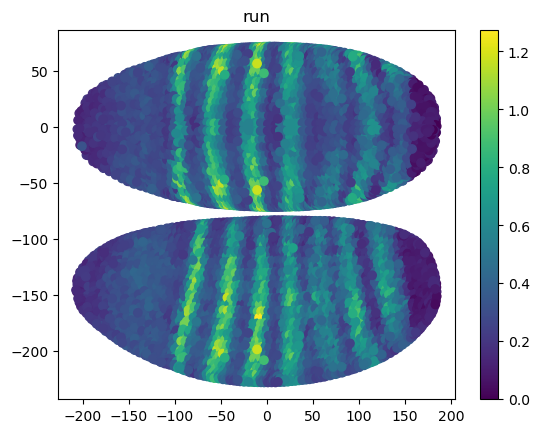

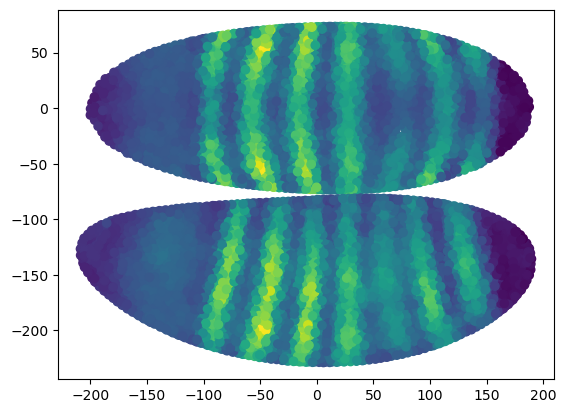

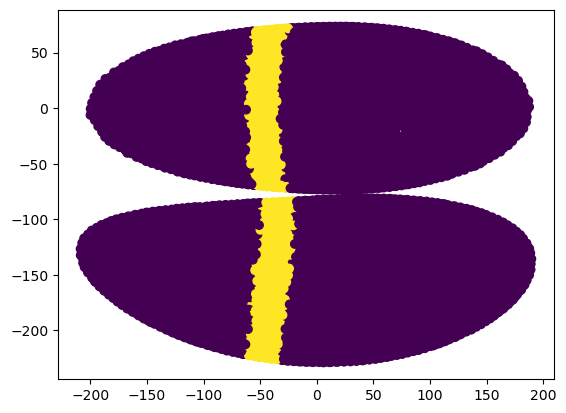

array([0., 0., 0., ..., 0., 0., 0.])

In [3]:
GE.gene("run",1)

# GE.get_fifth_run_stripe(True)
GE.get_second_run_stripe(True)

eve
twi
hkb
Dfd


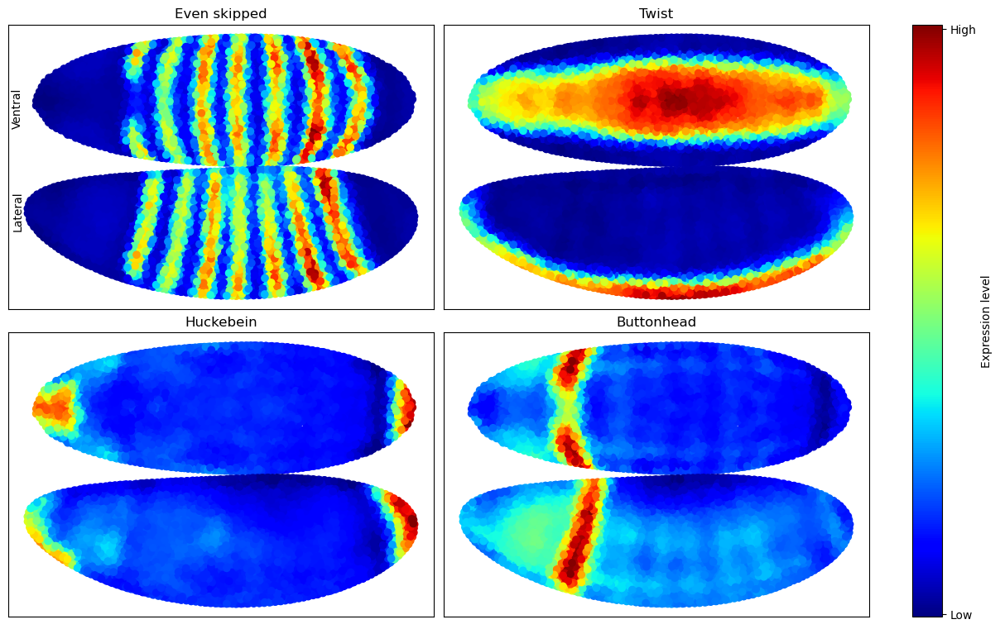

In [42]:
fig, axs = plt.subplots(2, 2, figsize=(12,7.5), constrained_layout=True)
axs = axs.flatten()
axind = 0

for realname, shortname in zip(["Even skipped", "Twist", "Huckebein", "Buttonhead"], ["eve", "twi", "hkb", "Dfd"]):
    ax = axs[axind]
    print(shortname)
    GE.prettyplot(shortname, ax)
    ax.set_title(realname, fontsize = 12)

    # remove the axis
    ax.set_xticks([])
    ax.set_yticks([])
    
    axind += 1

    # if axind > 1:
    #     break


axs[0].text(-225, -30, "Ventral", fontsize=10, rotation=90)
axs[0].text(-225, -150, "Lateral", fontsize=10, rotation=90)
# make colorbar
cb = fig.colorbar(axs[1].collections[0], ax=axs, orientation='vertical', label='Expression level')
cb.set_ticks([0.04, 1.])
cb.set_ticklabels(['Low', 'High'])

In [129]:
for i in range(len(gene_positions_dict.keys())//4):
    print(list(gene_positions_dict.keys())[i*4:(i+1)*4])

['aay', 'Ama', 'Ance', 'Antp']
['apt', 'Blimp-1', 'bmm', 'bowl']
['brk', 'Btk29A', 'bun', 'cad']
['CenG1A', 'CG10479', 'CG11208', 'CG14427']
['CG17724', 'CG17786', 'CG43394', 'CG8147']
['cnc', 'croc', 'Cyp310a1', 'D']
['dan', 'danr', 'Dfd', 'disco']
['Doc2', 'Doc3', 'dpn', 'edl']
['ems', 'erm', 'Esp', 'E(spl)m5-HLH']
['eve', 'exex', 'fj', 'fkh']
['ftz', 'gk', 'gt', 'h']
['hb', 'hkb', 'htl', 'Ilp4']
['ImpE2', 'ImpL2', 'ken', 'kni']
['knrl', 'Kr', 'lok', 'Mdr49']
['Mes2', 'MESR3', 'mfas', 'Nek2']
['NetA', 'noc', 'nub', 'numb']
['oc', 'odd', 'peb', 'prd']
['pxb', 'rau', 'rho', 'run']
['sna', 'srp', 'tkv', 'tll']
['toc', 'Traf4', 'trn', 'tsh']
['twi', 'zen', 'zen2', 'zfh1']


[0.116516 0.11332  0.092872 ... 0.095975 0.220409 0.037587]
(3039,)


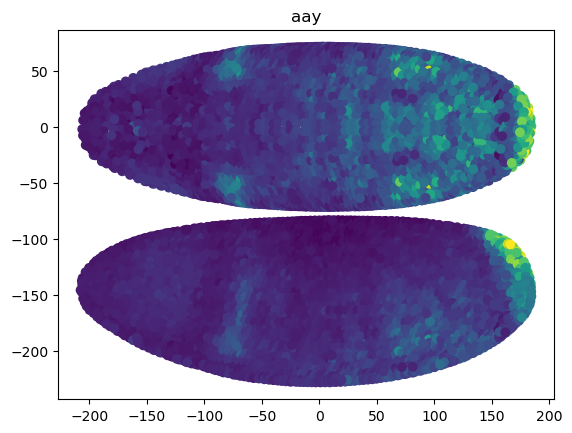

[0.22419  0.208761 0.172598 ... 0.648871 0.751017 0.458537]
(3039,)


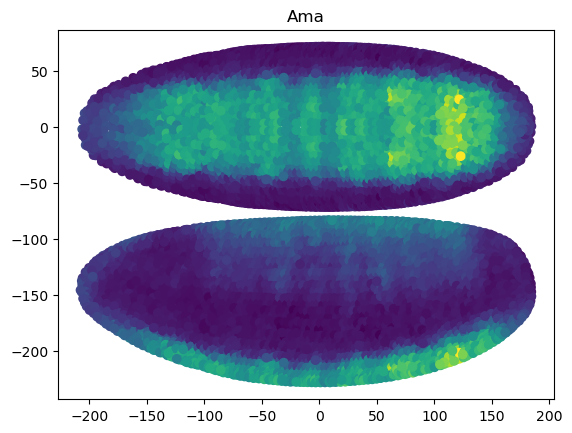

[0.03373  0.044785 0.036166 ... 0.014741 0.048882 0.080342]
(3039,)


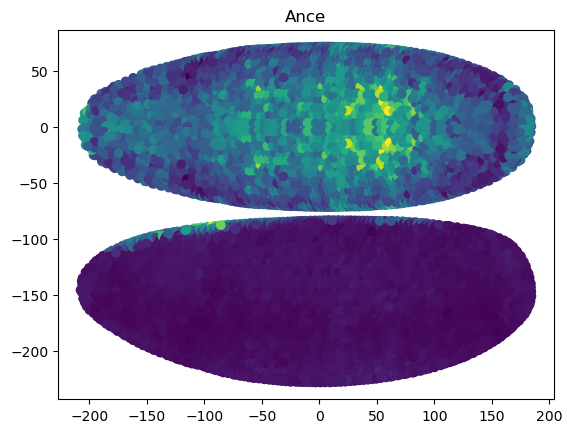

[0.104307 0.103447 0.096985 ... 0.184826 0.331598 0.264892]
(3039,)


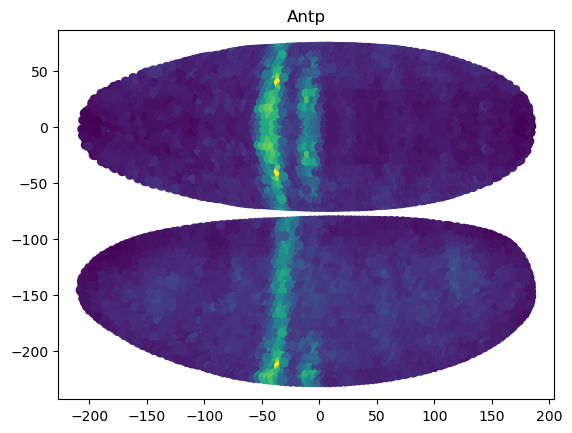

[0.673878 0.74382  0.838291 ... 0.357911 0.18988  0.131541]
(3039,)


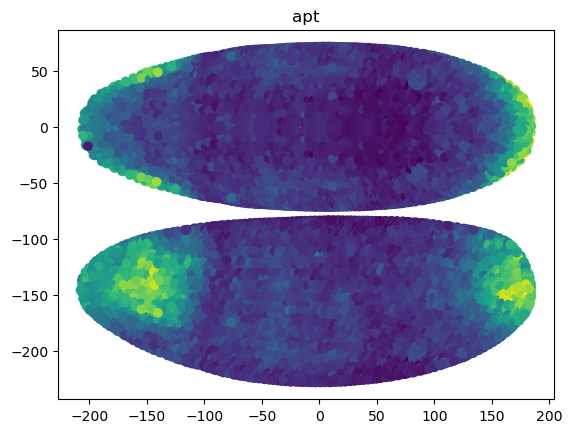

[0.85657  0.462554 0.467538 ... 0.406147 0.278077 0.251349]
(3039,)


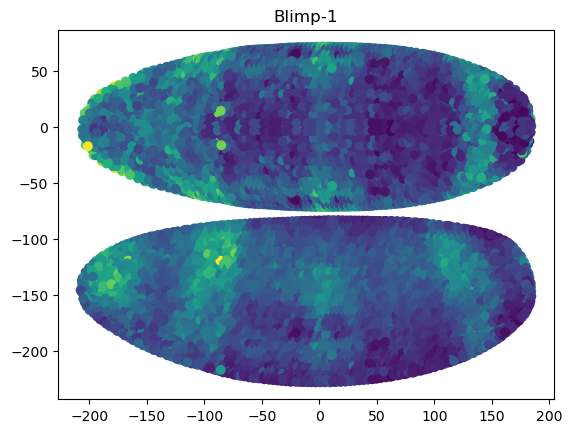

[0.469676 0.570401 0.478229 ... 0.400752 0.177882 0.016303]
(3039,)


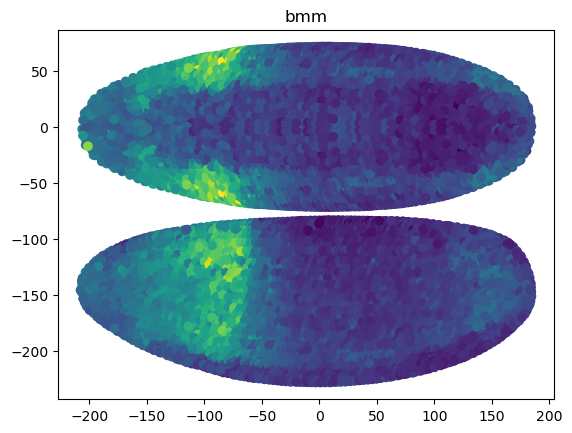

[0.286151 0.34524  0.377768 ... 0.308844 0.182164 0.177594]
(3039,)


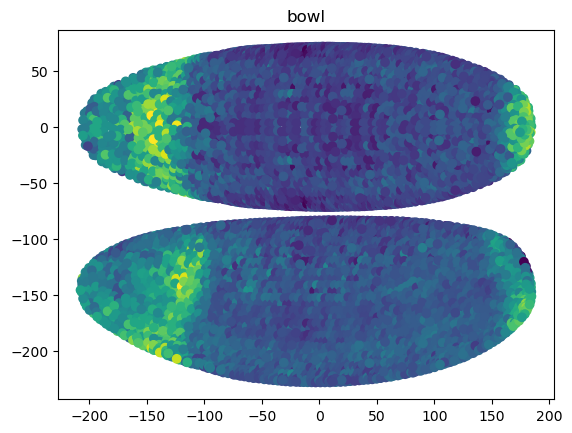

[0.320923 0.320727 0.297598 ... 0.437903 0.107902 0.138194]
(3039,)


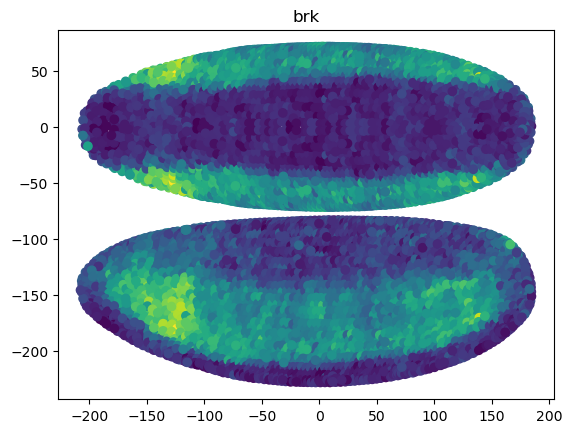

[0.737946 0.913163 0.931254 ... 0.133464 0.188577 0.543184]
(3039,)


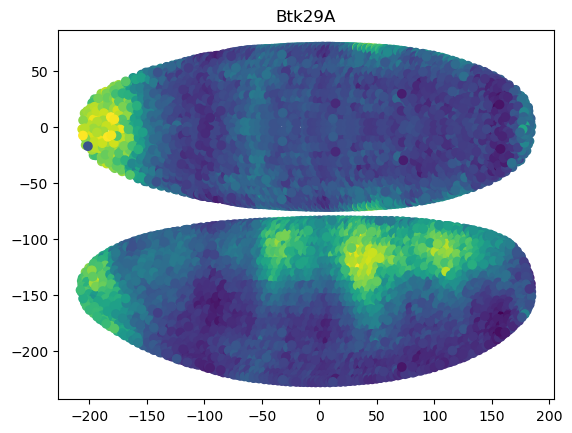

[0.381798 0.40439  0.462129 ... 0.262972 0.219262 0.605375]
(3039,)


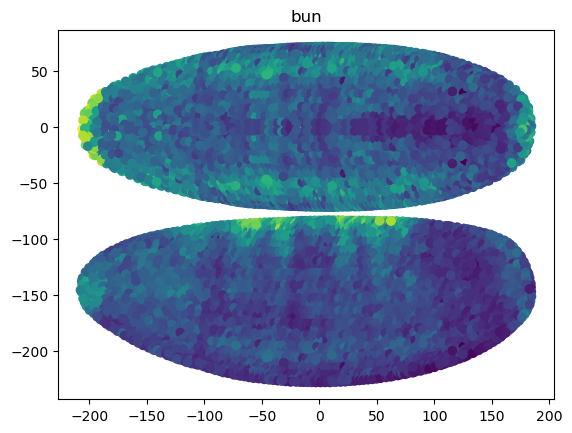

[0.687297 0.506107 0.383478 ... 0.471598 0.406362 0.358321]
(3039,)


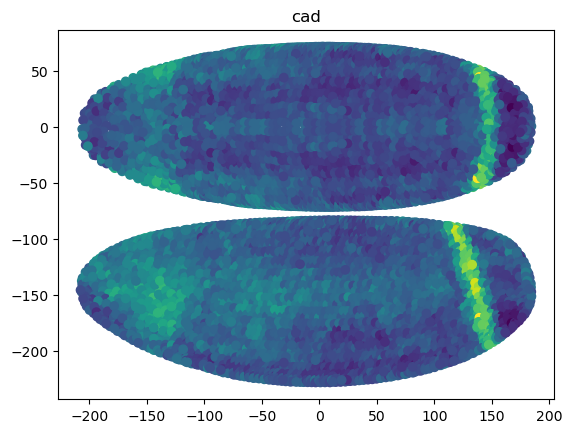

[0.233663 0.396959 0.392886 ... 0.347586 0.373993 0.107245]
(3039,)


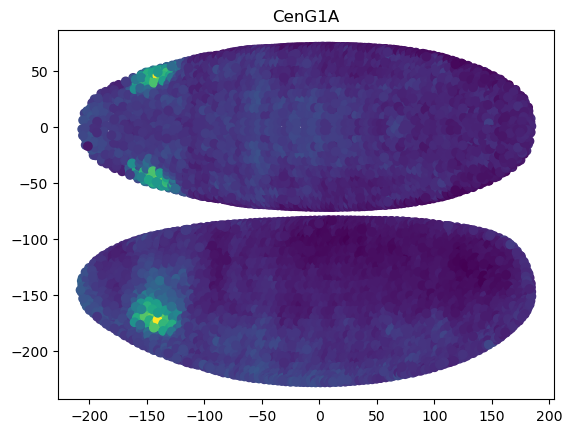

[0.381811 0.280377 0.389087 ... 0.303448 0.311925 0.494677]
(3039,)


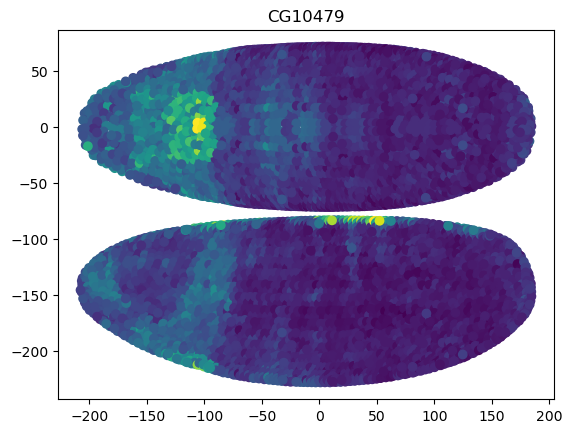

[0.361505 0.387934 0.39307  ... 0.380959 0.238193 0.33473 ]
(3039,)


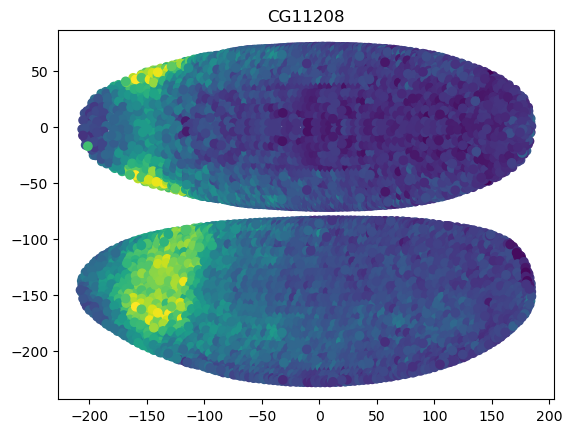

[0.609916 0.853094 0.845314 ... 0.549509 0.361624 0.128112]
(3039,)


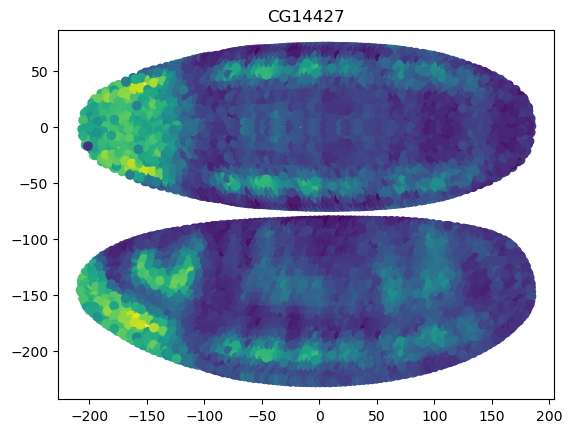

[0.253724 0.185755 0.227202 ... 0.310686 0.107598 0.016692]
(3039,)


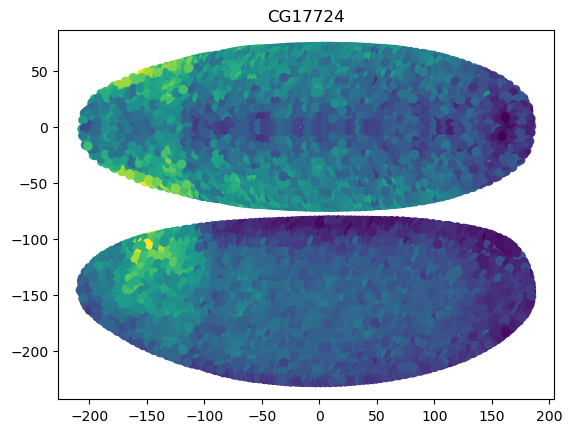

[0.254912 0.287737 0.290641 ... 0.290616 0.168624 0.167255]
(3039,)


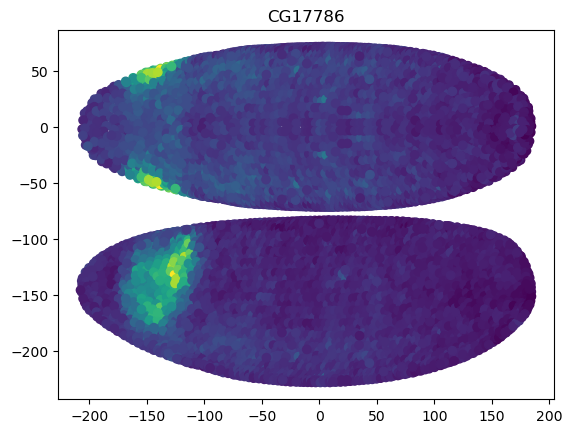

[0.093843 0.098158 0.097539 ... 0.6423   0.023294 0.008882]
(3039,)


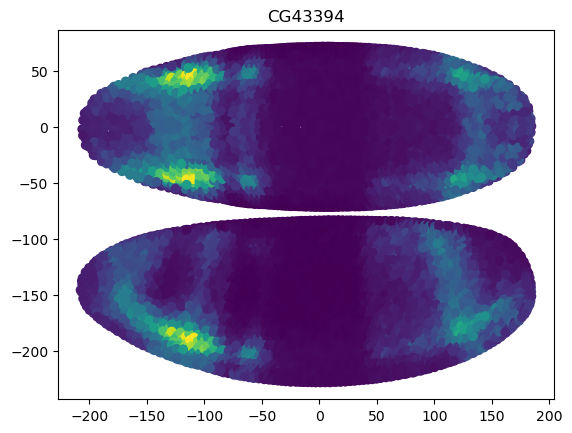

[0.058766 0.125432 0.143273 ... 0.082436 0.175604 0.288958]
(3039,)


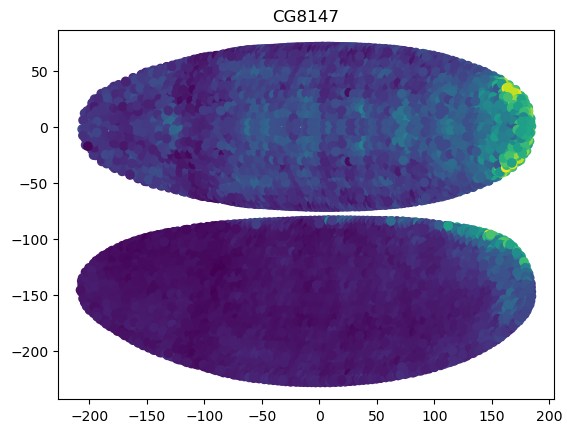

[0.921377 0.651969 0.779386 ... 0.345954 0.280116 0.170835]
(3039,)


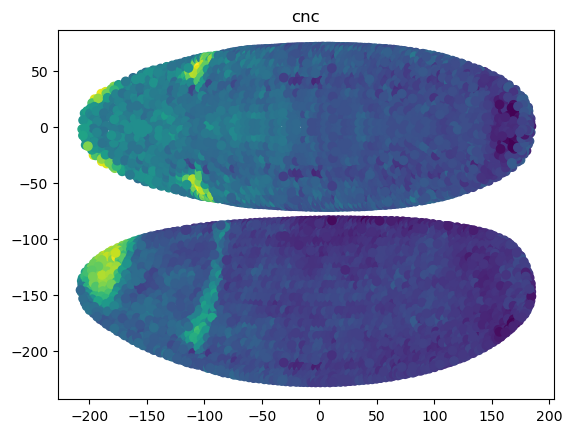

[0.605678 0.485412 0.461949 ... 0.163301 0.260711 0.315099]
(3039,)


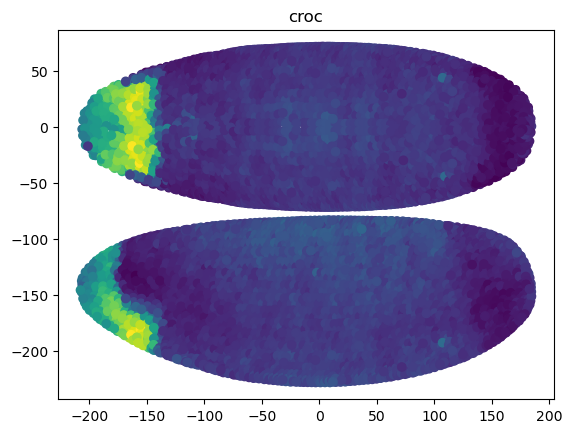

[0.339219 0.40443  0.372933 ... 0.481669 0.662546 0.12416 ]
(3039,)


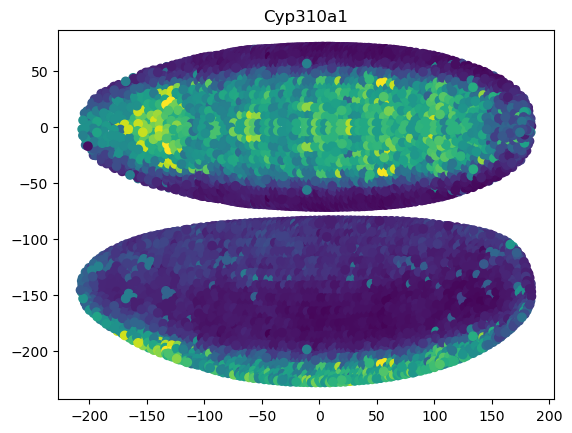

[0.138697 0.044165 0.174438 ... 0.154155 0.202047 0.429646]
(3039,)


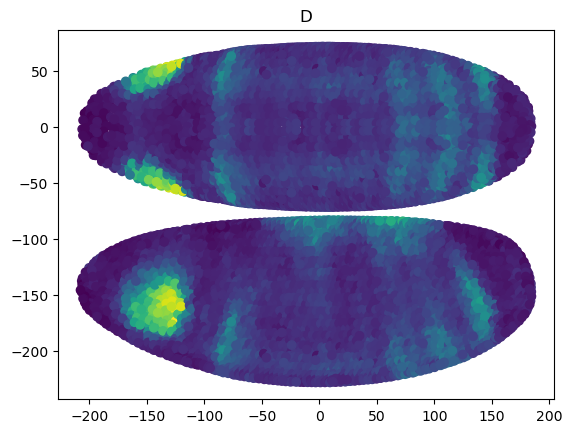

[0.156448 0.119454 0.116143 ... 0.488586 0.522317 0.097858]
(3039,)


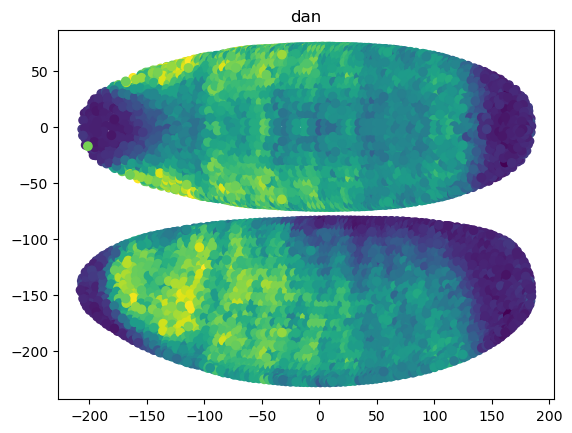

[0.208473 0.097316 0.143959 ... 0.530365 0.339151 0.110069]
(3039,)


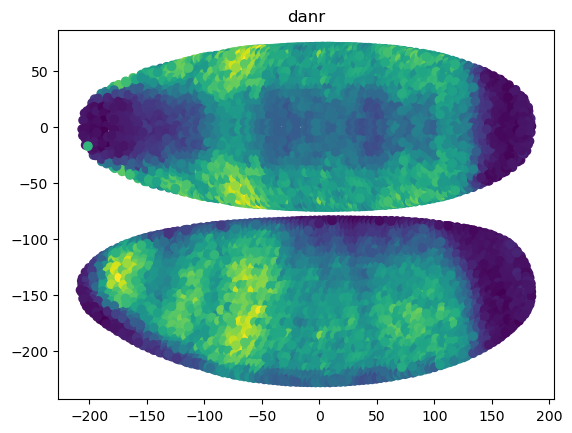

[0.238146 0.268831 0.282022 ... 0.44178  0.185539 0.061552]
(3039,)


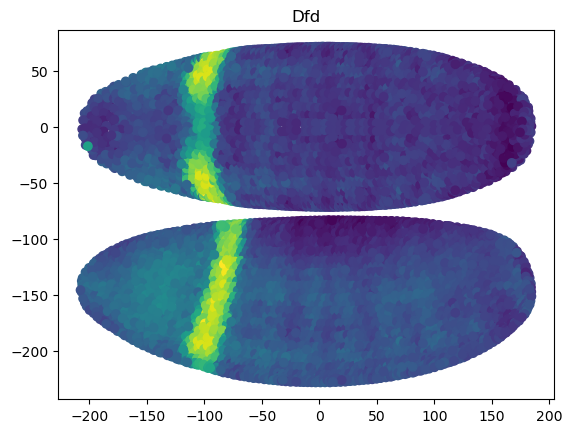

[0.227558 0.320451 0.257261 ... 0.31428  0.194521 0.071766]
(3039,)


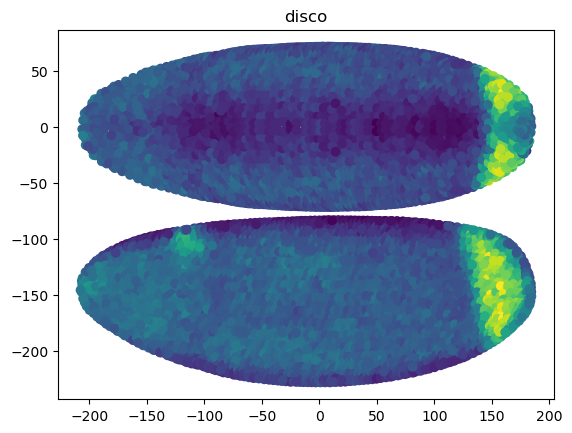

[0.256565 0.196483 0.230007 ... 0.108524 0.151742 0.432232]
(3039,)


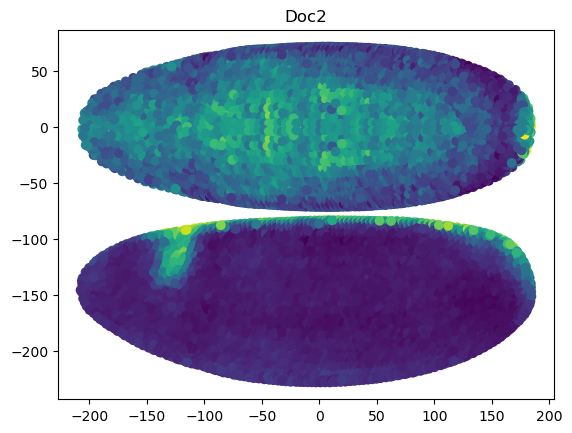

[0.78742  0.670256 0.684984 ... 0.186502 0.193192 0.410496]
(3039,)


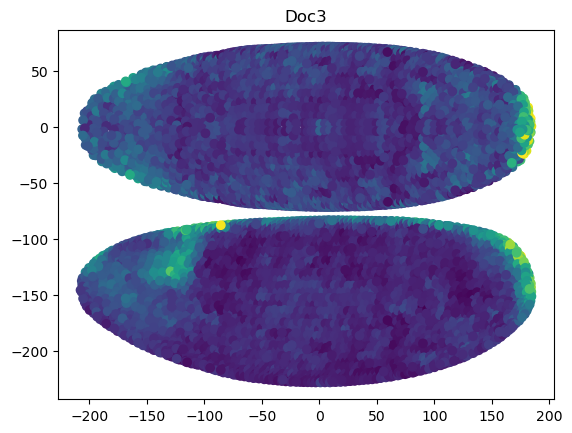

[0.103006 0.091844 0.068626 ... 0.276122 0.07514  0.635193]
(3039,)


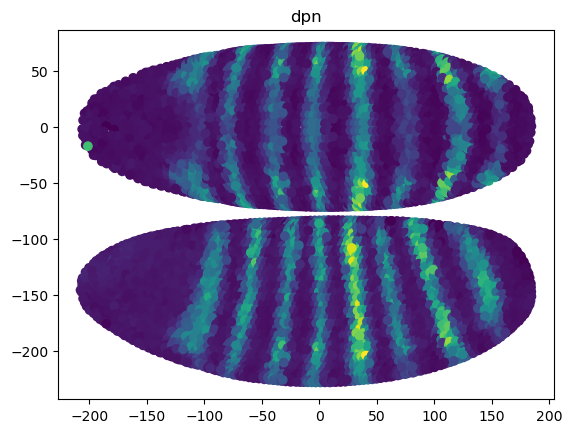

[0.15012  0.130715 0.184325 ... 0.025439 0.260582 0.207661]
(3039,)


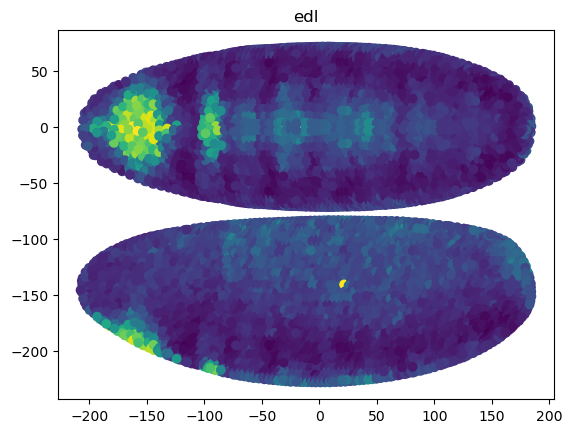

[0.191256 0.178339 0.192171 ... 0.297879 0.149127 0.101572]
(3039,)


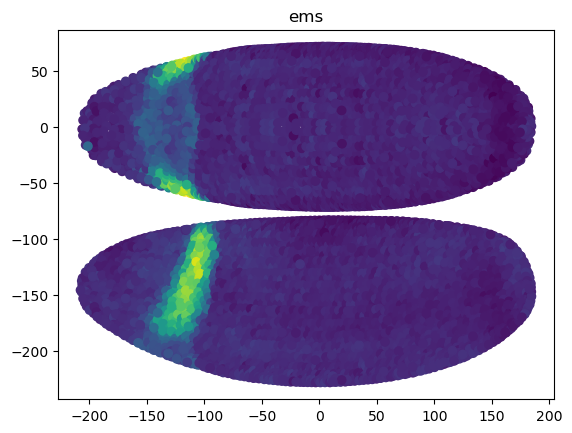

[0.196404 0.21607  0.115667 ... 0.177122 0.125375 0.105334]
(3039,)


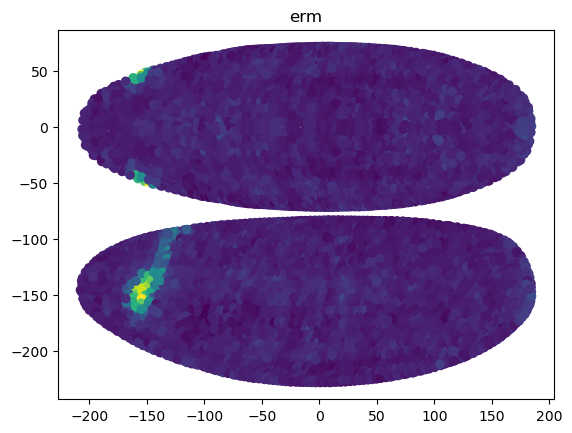

[0.264237 0.401332 0.349451 ... 0.152979 0.239945 0.184698]
(3039,)


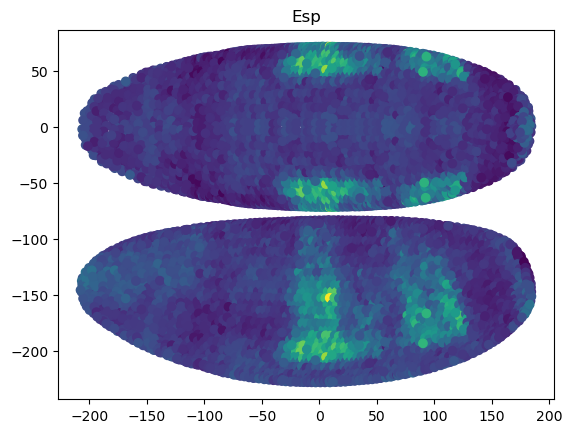

[0.476448 0.36019  0.420827 ... 0.743751 0.332179 0.179903]
(3039,)


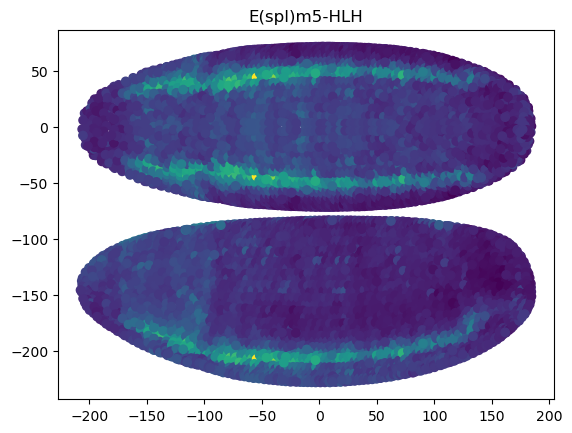

[0.02279  0.026128 0.021572 ... 0.028549 0.227646 0.079885]
(3039,)


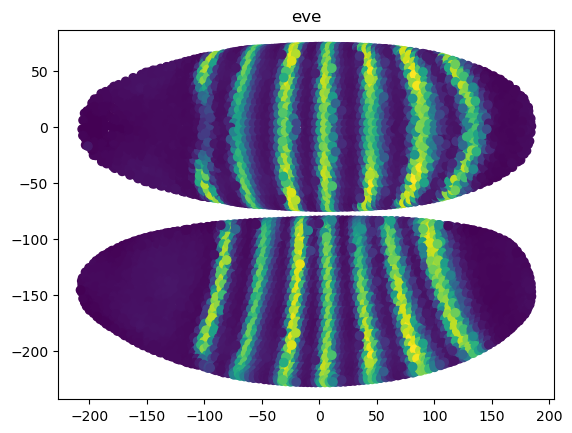

[0.320591 0.293545 0.297391 ... 0.196635 0.183538 0.120308]
(3039,)


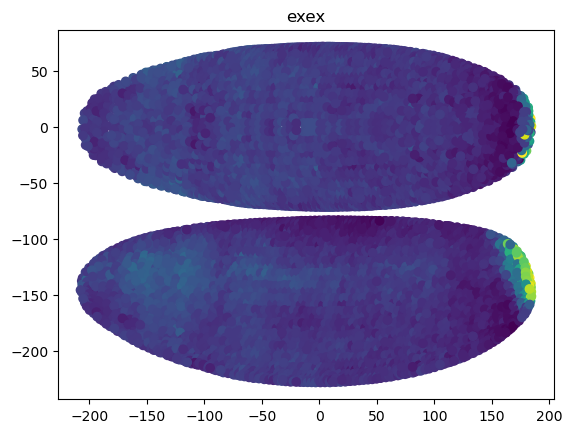

[0.117664 0.190048 0.168044 ... 0.233035 0.149292 0.088582]
(3039,)


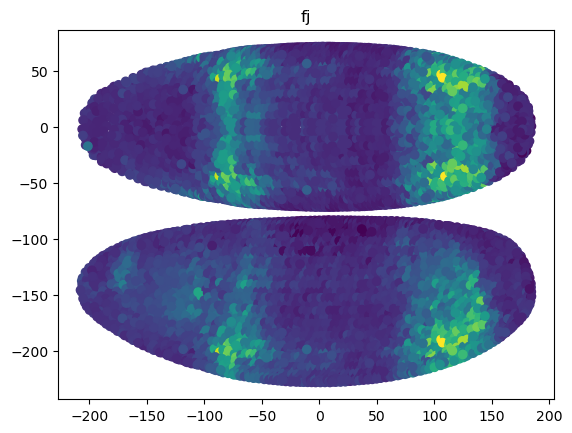

[0.594566 0.687082 0.688592 ... 0.071762 0.099473 0.019614]
(3039,)


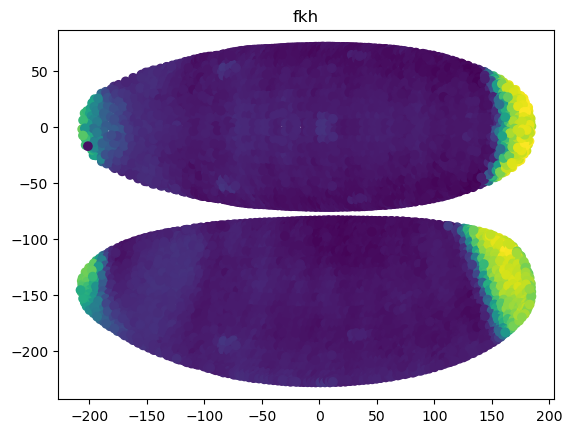

[0.038998 0.037326 0.044834 ... 0.042051 0.192329 0.713985]
(3039,)


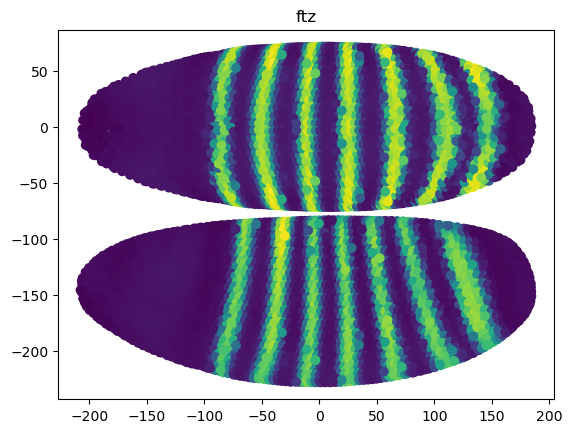

[0.360116 0.279296 0.313368 ... 0.378767 0.178887 0.594898]
(3039,)


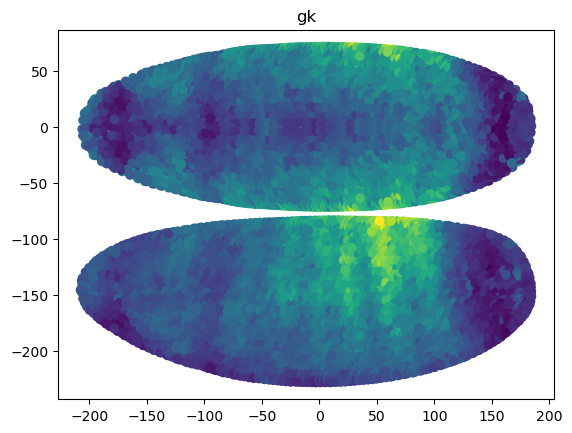

[0.19957  0.105881 0.114784 ... 0.100967 0.075379 0.015877]
(3039,)


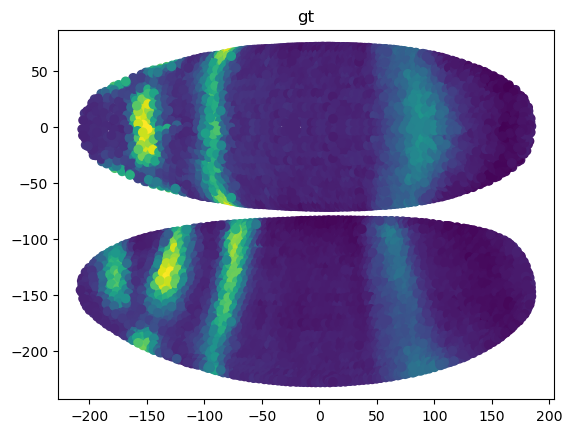

[0.549831 0.271741 0.271741 ... 0.404777 0.304654 0.442521]
(3039,)


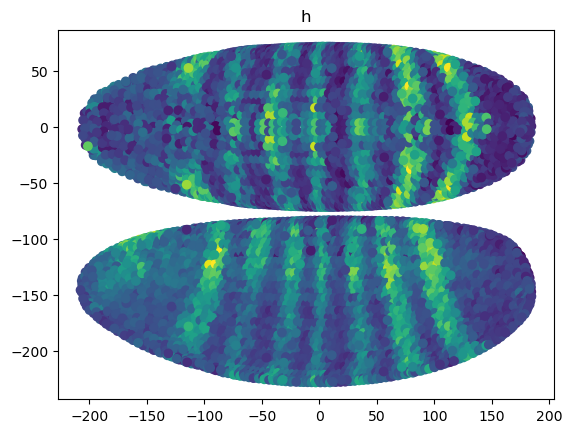

[0.079849 0.103871 0.078566 ... 0.119125 0.096539 0.026782]
(3039,)


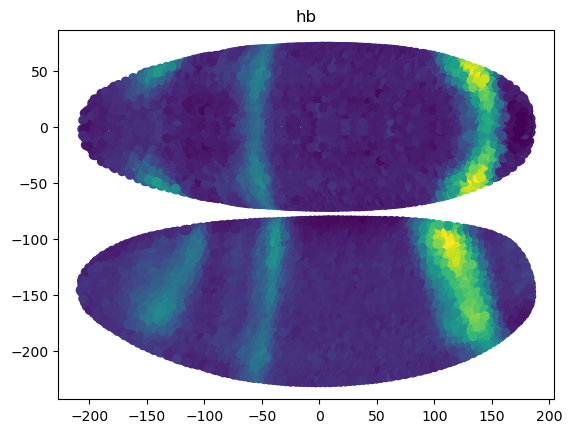

[0.305527 0.371182 0.385519 ... 0.108603 0.139083 0.043484]
(3039,)


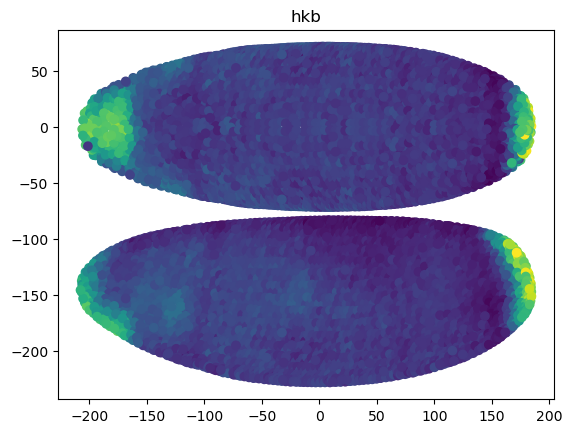

[0.145274 0.17849  0.162996 ... 0.279437 0.837188 0.109412]
(3039,)


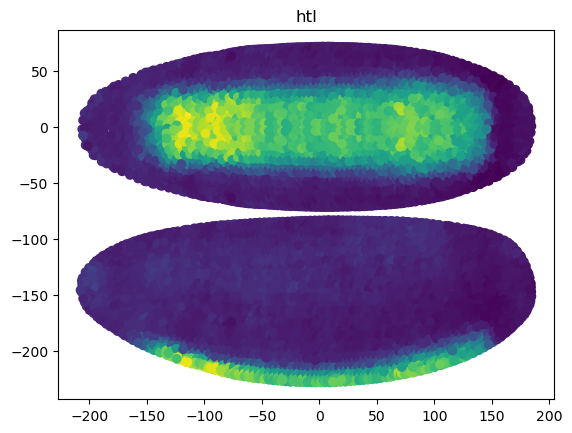

[0.0412   0.098845 0.068279 ... 0.298333 0.34516  0.031437]
(3039,)


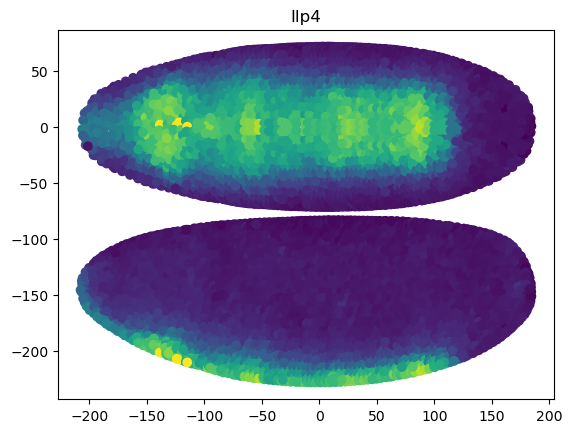

[0.467845 0.877808 0.76236  ... 0.1579   0.153015 0.038577]
(3039,)


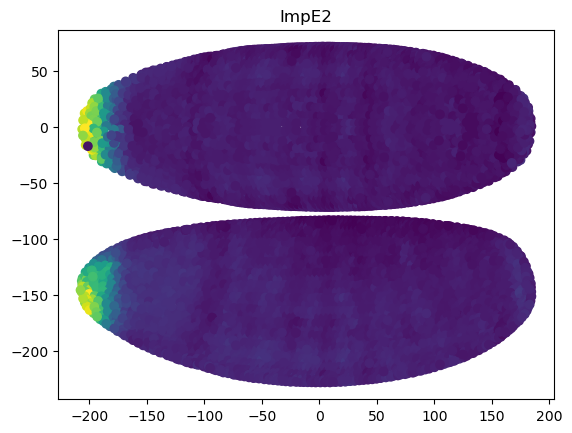

[0.270913 0.297817 0.361615 ... 0.308151 0.193808 0.060668]
(3039,)


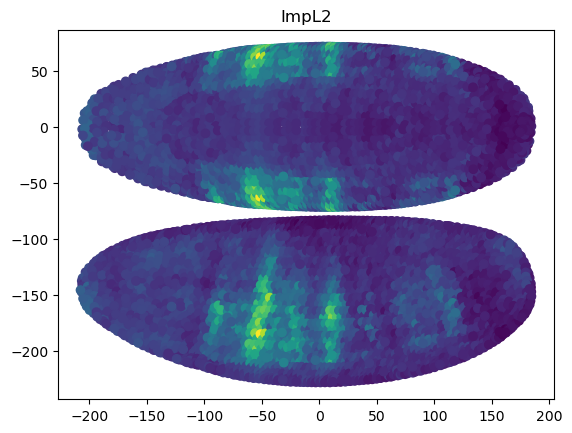

[0.177503 0.249151 0.193683 ... 0.123592 0.078398 0.068498]
(3039,)


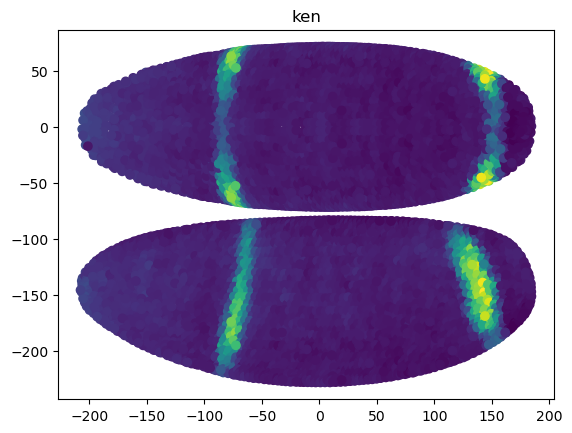

[0.845587 1.034689 0.995677 ... 0.874525 0.129089 0.249773]
(3039,)


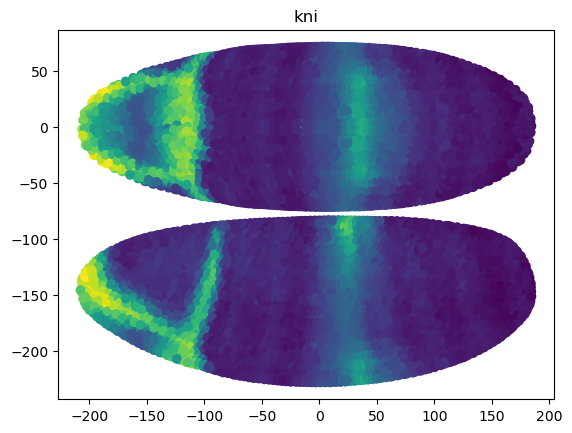

[0.456425 0.617936 0.534053 ... 0.508228 0.11368  0.045837]
(3039,)


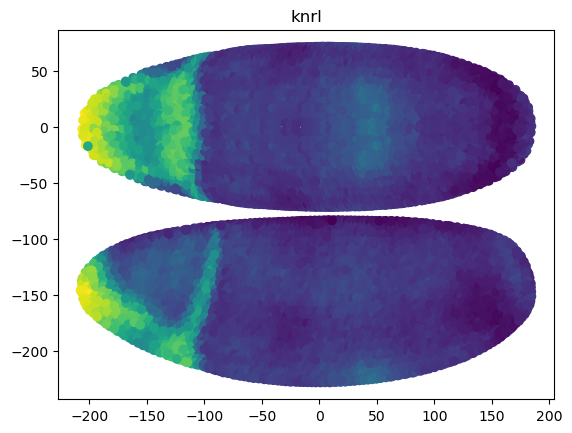

[0.027406 0.040977 0.044551 ... 0.028818 0.509169 0.543188]
(3039,)


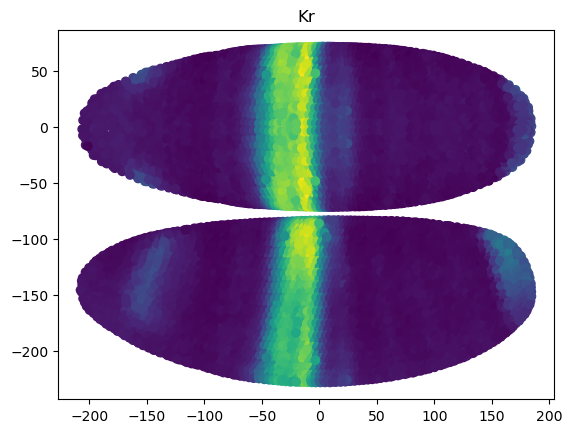

[0.127881 0.189824 0.174015 ... 0.133264 0.247213 0.158942]
(3039,)


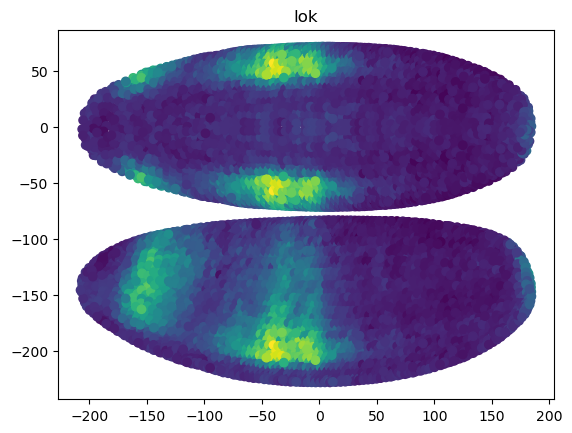

[0.298158 0.616076 0.563534 ... 0.167726 0.387356 0.132733]
(3039,)


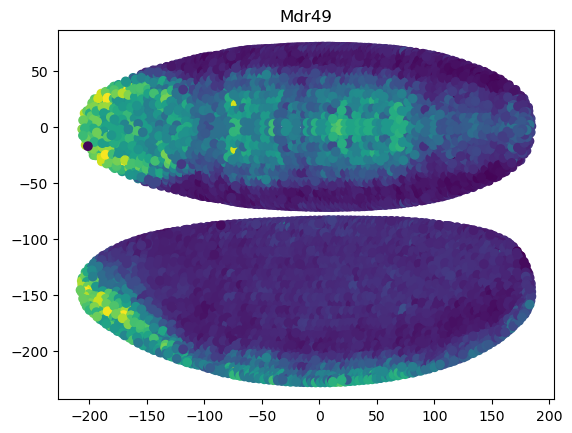

[0.287286 0.398116 0.374514 ... 0.568675 0.812202 0.042131]
(3039,)


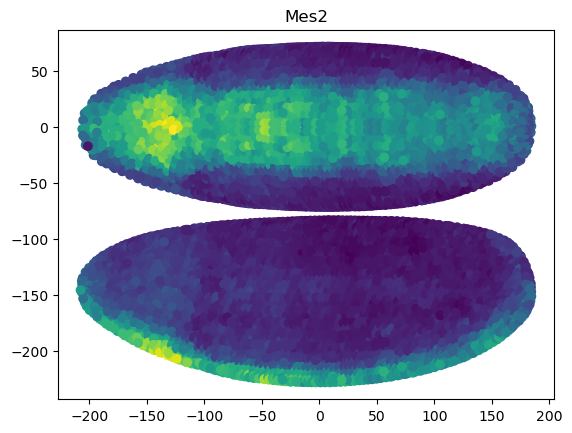

[0.159641 0.137903 0.087937 ... 0.212421 0.259579 0.140382]
(3039,)


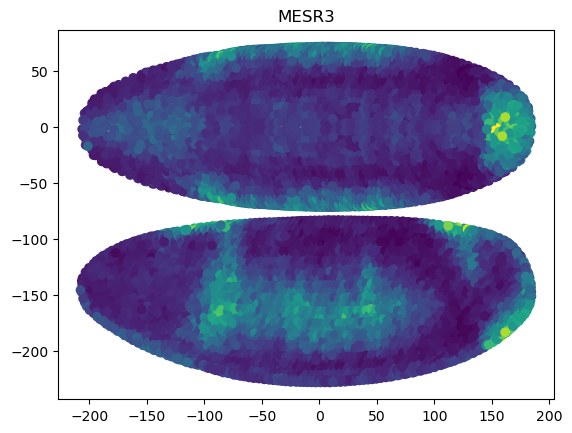

[0.22286  0.321899 0.333601 ... 0.353384 0.300661 0.346995]
(3039,)


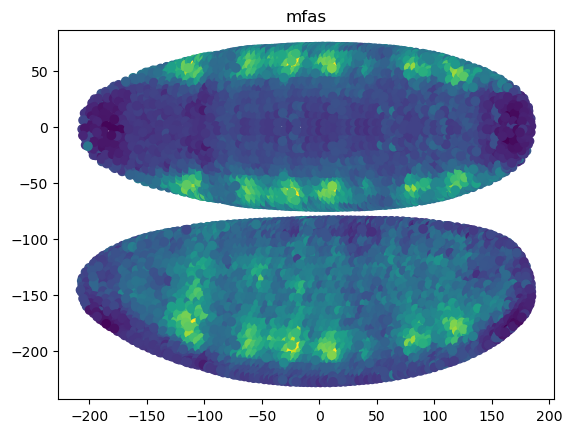

[0.443556 0.548428 0.397458 ... 0.4746   0.141263 0.190479]
(3039,)


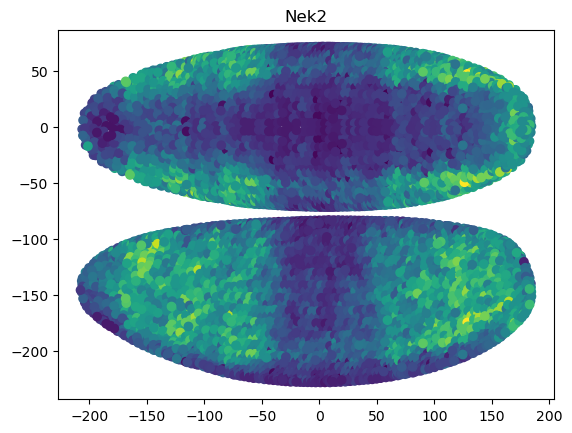

[0.125356 0.144211 0.156717 ... 0.386183 0.789927 0.018516]
(3039,)


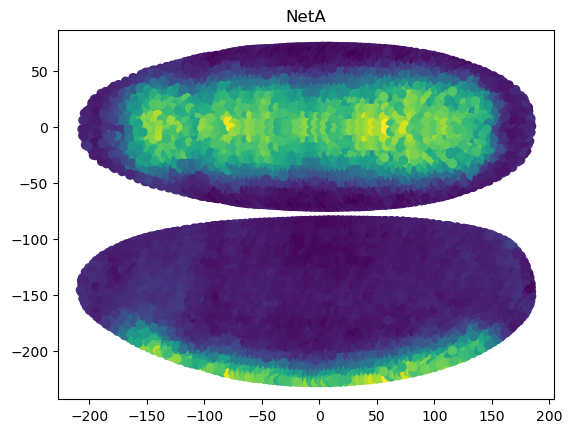

[0.266378 0.180692 0.198137 ... 0.141936 0.074173 0.069411]
(3039,)


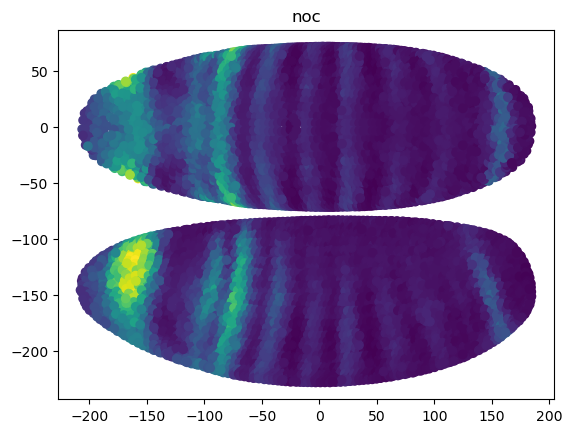

[0.25483  0.204195 0.212683 ... 0.112231 0.123519 0.215983]
(3039,)


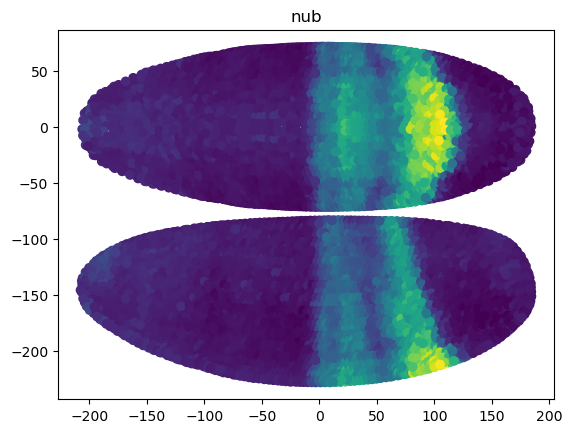

[0.59793  0.421376 0.445464 ... 0.098953 0.126247 0.177473]
(3039,)


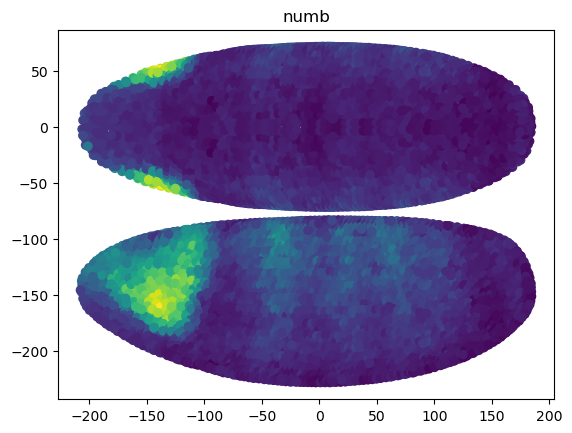

[0.131504 0.12691  0.148747 ... 0.160083 0.115216 0.043324]
(3039,)


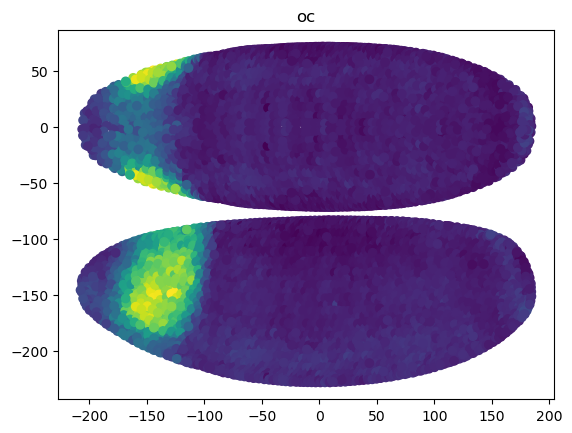

[0.200337 0.61119  0.530632 ... 0.037321 0.110343 0.449204]
(3039,)


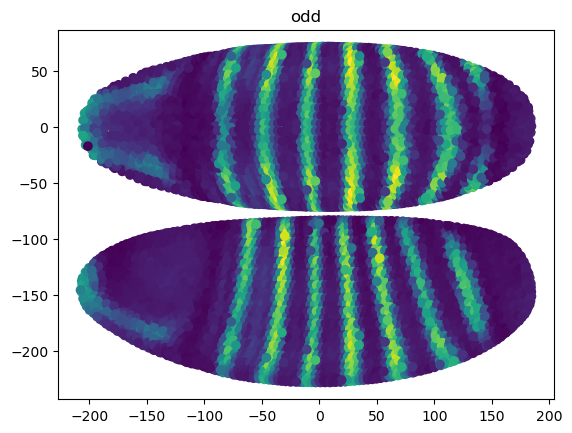

[0.24418  0.250616 0.167491 ... 0.410751 0.216484 0.036449]
(3039,)


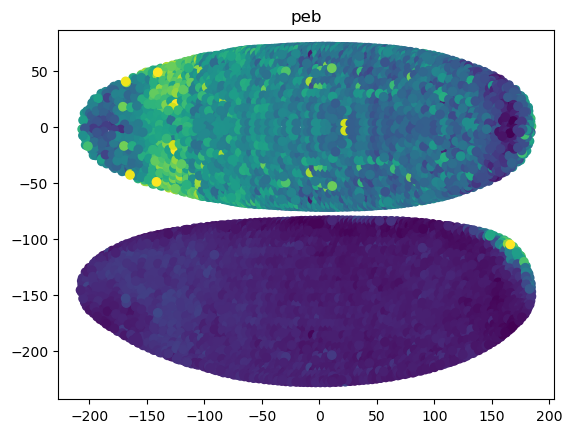

[0.05825  0.026934 0.02529  ... 0.064112 0.161177 0.457127]
(3039,)


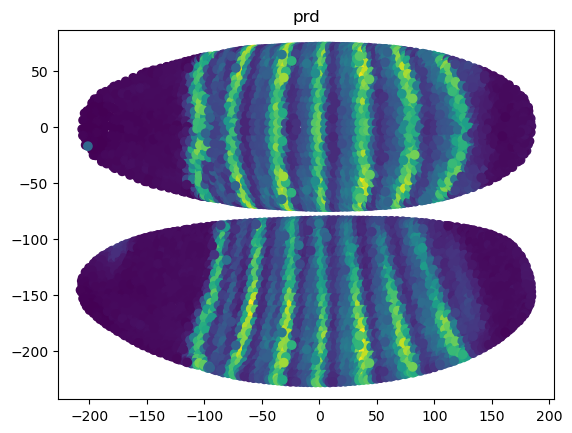

[0.464401 0.606565 0.379759 ... 0.434161 0.237014 0.335534]
(3039,)


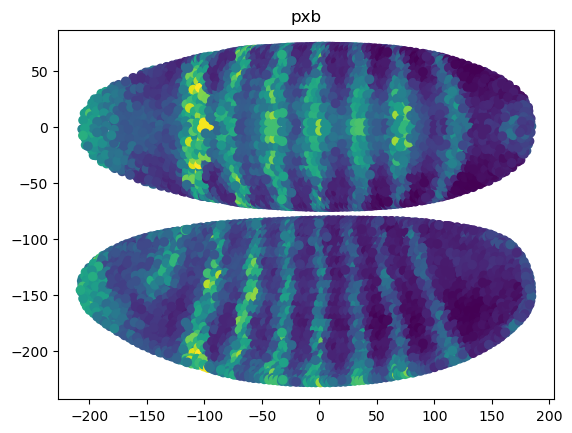

[0.345198 0.320105 0.320733 ... 0.156936 0.119362 0.07568 ]
(3039,)


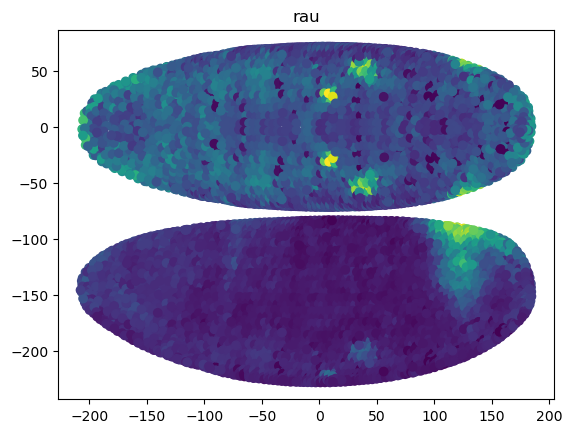

[0.316686 0.366646 0.349392 ... 0.360522 0.23175  0.697074]
(3039,)


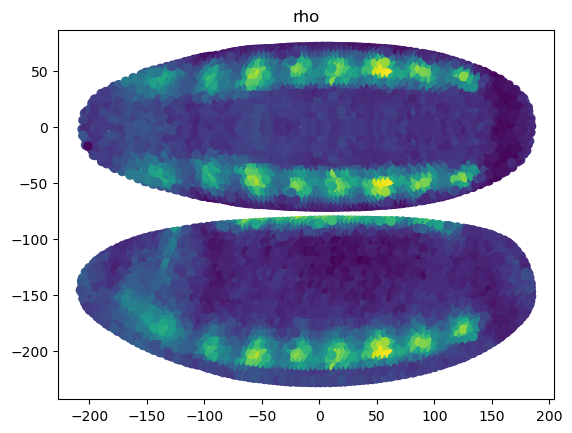

[0.250317 0.172003 0.213728 ... 0.300406 0.585144 0.48129 ]
(3039,)


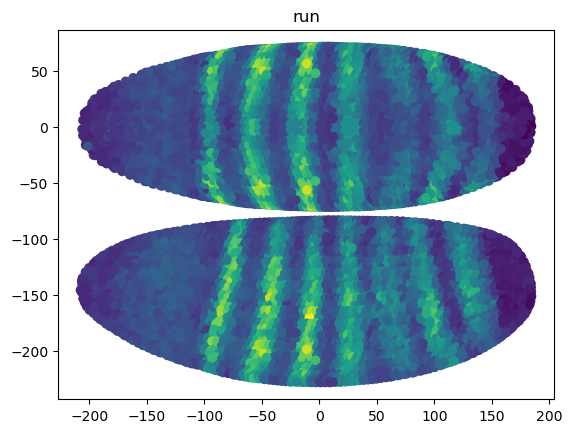

[0.111794 0.221231 0.159118 ... 0.746477 0.893983 0.009584]
(3039,)


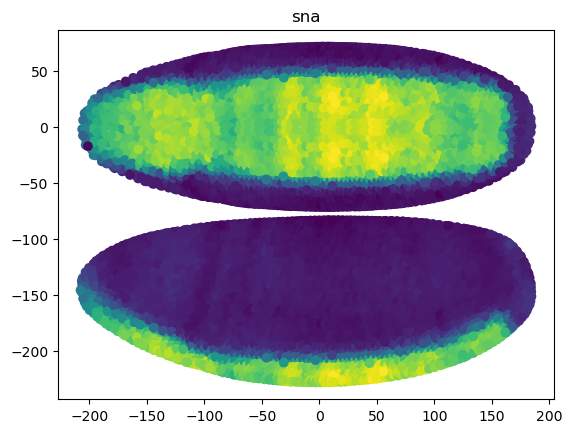

[0.240833 0.120429 0.096322 ... 0.643706 0.193298 0.075983]
(3039,)


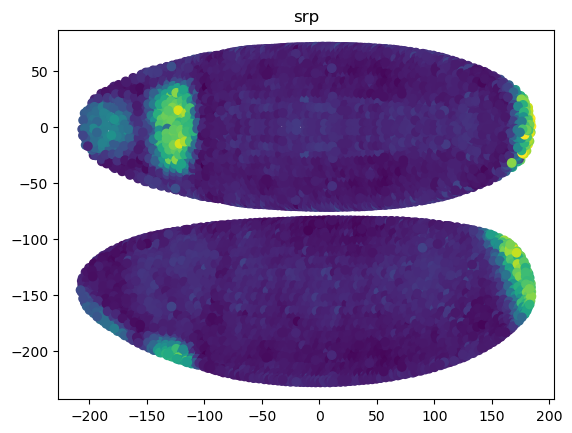

[0.353227 0.268072 0.315466 ... 0.466361 0.57835  0.445649]
(3039,)


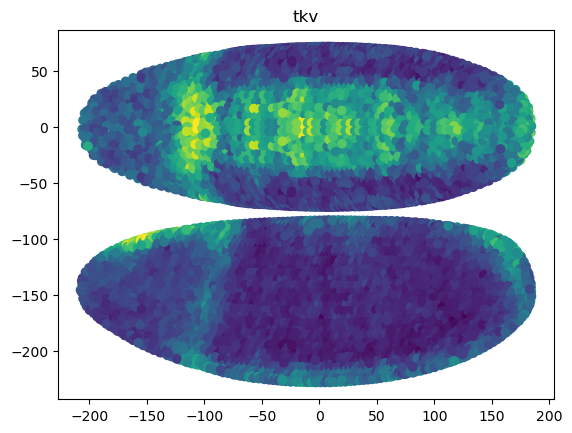

[0.102896 0.093506 0.090488 ... 0.085663 0.065762 0.017237]
(3039,)


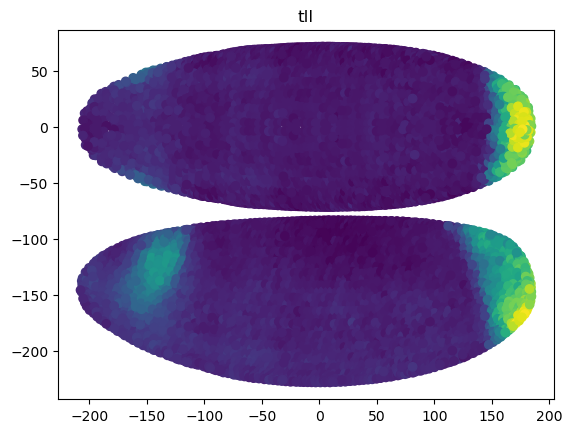

[0.153453 0.206405 0.196441 ... 0.055872 0.041828 0.085015]
(3039,)


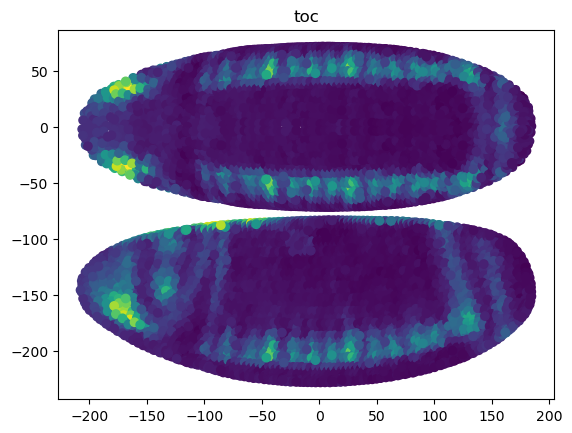

[0.12936  0.313327 0.161869 ... 0.270265 0.503958 0.13541 ]
(3039,)


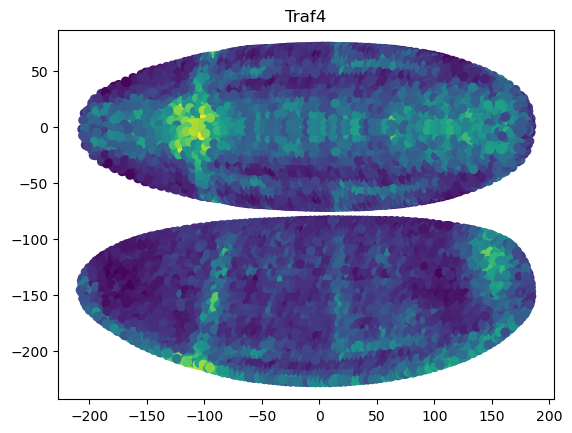

[0.087361 0.230506 0.102645 ... 0.35961  0.187839 0.104293]
(3039,)


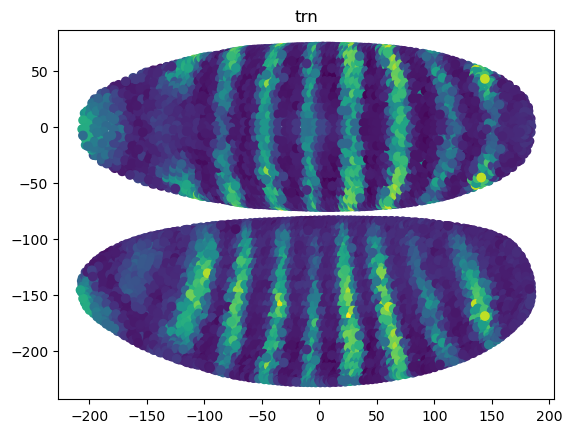

[0.147089 0.190749 0.177968 ... 0.156088 0.852346 0.548515]
(3039,)


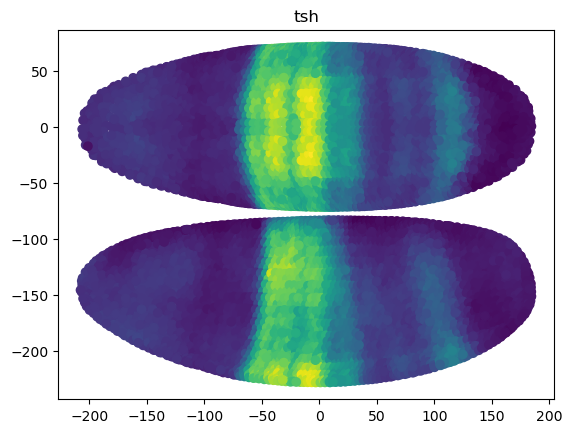

[0.225082 0.440296 0.347098 ... 0.444891 0.937886 0.050582]
(3039,)


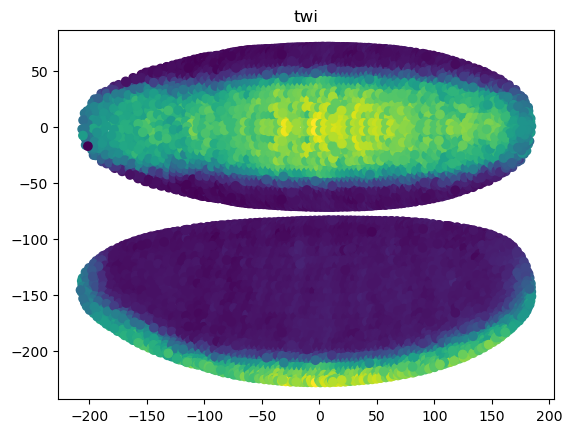

[0.027564 0.024157 0.019817 ... 0.017977 0.039697 0.24379 ]
(3039,)


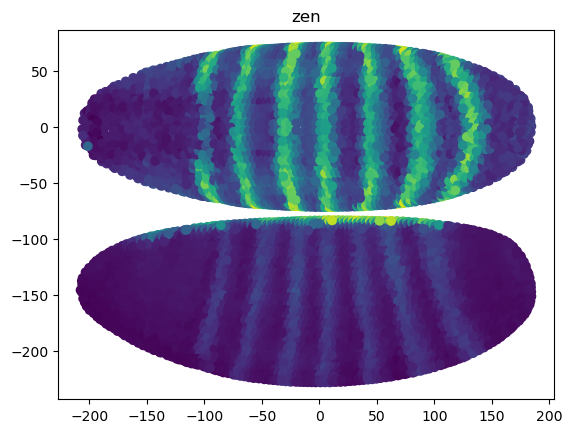

[0.297847 0.455723 0.598716 ... 0.125641 0.340491 0.466997]
(3039,)


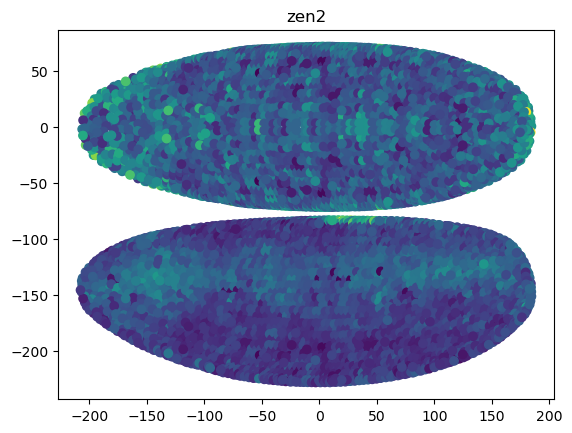

[0.372422 0.389489 0.502384 ... 0.380294 0.286497 0.219312]
(3039,)


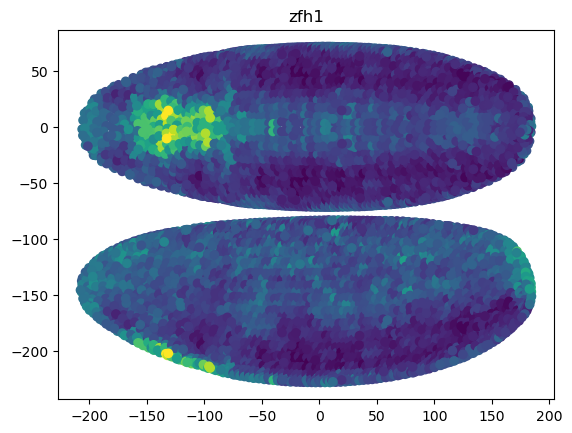

In [122]:
for k in gene_positions_dict.keys():
    get_map(k)
    plt.title(k)
    plt.show()